In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import umap
import torch
import torch.nn as nn
import torch.nn.functional as F
import gc
from tqdm import tqdm

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
os.chdir('../IConNet/')
os.getcwd()

'/home/linh/projects/IConNet'

In [5]:
dataset_name = 'ravdess'
log_dir = f'../scb9_models/{dataset_name}/'
data_dir = "../data/data_preprocessed/"
experiment_prefix = "scb9"

sr = 16000
batch_size = 4
in_channels = 1
num_segments = 8
out_channels = num_segments*batch_size
embedding_dim = 1023
num_embeddings = 384
cls_dim = 512
downsampling = 8
commitment_cost = 0.1
learning_rate = 1e-3
num_tokens_per_second = 16
max_num_tokens = 256
num_classes = 4
num_training_updates = 1000
log_interval = 100
test_interval = 100

In [6]:
from IConNet.acov.audio_vqvae import VqVaeClsLoss
from IConNet.trainer.train_torch import Trainer, get_dataloader
from IConNet.acov.model import SCB8 as SCB
from omegaconf import OmegaConf as ocf

n_epoch = 4

loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.1)

trainer = Trainer(batch_size=batch_size, log_dir=log_dir, 
                  experiment_prefix=experiment_prefix, device=device,
                 accumulate_grad_batches=4)

dataset_config_path = f'config/dataset/{dataset_name}.yaml'
dataset_config = ocf.load(dataset_config_path)
print(dataset_config)
train_loader, test_loader, batch_size = get_dataloader(
    dataset_config, data_dir, batch_size=batch_size)
print(batch_size)

trainer.prepare(train_loader=train_loader, 
                test_loader=test_loader, 
                batch_size=batch_size,
               loss_ratio=loss_ratio)

{'name': 'ravdess', 'dataset_class': 'WaveformDataset', 'root': 'ravdess/', 'audio_dir': 'full_release/', 'feature_dir': 'preprocessing/', 'label_name': 'label_emotion_key', 'feature_name': 'audio16k', 'num_classes': 8, 'label_values': ['neu', 'cal', 'hap', 'sad', 'ang', 'fea', 'dis', 'sur'], 'classnames': ['neu', 'cal', 'hap', 'sad', 'ang', 'fea', 'dis', 'sur'], 'target_labels': ['ang', 'neu', 'sad', 'hap']}
4


In [7]:
loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=0.1, loss_recon=1, loss_cls=0.1)
trainer.loss_ratio = loss_ratio
model = SCB(
    in_channels=in_channels, 
    out_channels=out_channels,         
    num_embeddings=num_embeddings, 
    embedding_dim=embedding_dim, 
    commitment_cost=commitment_cost,
    num_classes=num_classes, 
    num_tokens_per_second=num_tokens_per_second, # recommended: 4, 8 or 16
    downsampling=downsampling, # recommended: 5 or 8
    cls_dim=cls_dim,
    sample_rate=sr,
    sample_mode='envelope',
    distance_type='euclidean'
)

In [8]:
trainer.setup(model=model, lr=1e-3)

In [9]:
trainer.fit(n_epoch=20)

  2%|█                                                      | 0.37430167597765335/20 [00:37<34:08, 104.37s/it]

Epoch: 1	Loss: 6.930 [perplexity=9.014, loss_vq=18.212, loss_recon=4.981, loss_cls=1.280]	Val_acc: 9/27 (33.33%)



  2%|█                                                     | 0.3798882681564243/20 [00:44<2:23:56, 440.19s/it]

Saved new best model: ../scb9_models/ravdess/model.epoch=1.step=51.loss=6.930.val_acc=0.333.pt


  6%|███                                                    | 1.128491620111737/20 [02:05<2:20:36, 447.06s/it]

Epoch: 2	Loss: 30.466 [perplexity=10.992, loss_vq=203.900, loss_recon=9.895, loss_cls=1.809]	Val_acc: 0/27 (0.00%)



  9%|█████▍                                                    | 1.87150837988828/20 [03:19<31:27, 104.11s/it]

Epoch: 3	Loss: 8.053 [perplexity=15.937, loss_vq=4.837, loss_recon=7.502, loss_cls=0.673]	Val_acc: 0/27 (0.00%)



 13%|███████▏                                               | 2.625698324022365/20 [04:45<2:07:42, 441.04s/it]

Epoch: 4	Loss: 34.934 [perplexity=24.914, loss_vq=274.249, loss_recon=7.394, loss_cls=1.148]	Val_acc: 9/27 (33.33%)



 17%|█████████                                             | 3.3743016759776787/20 [06:05<2:00:31, 434.96s/it]

Epoch: 5	Loss: 20.357 [perplexity=8.234, loss_vq=127.778, loss_recon=7.465, loss_cls=1.143]	Val_acc: 9/27 (33.33%)



 21%|███████████▋                                             | 4.117318435754221/20 [07:19<26:40, 100.76s/it]

Epoch: 6	Loss: 36.896 [perplexity=13.088, loss_vq=314.526, loss_recon=5.289, loss_cls=1.550]	Val_acc: 9/27 (33.33%)



 24%|█████████████▍                                         | 4.871508379888306/20 [08:46<1:51:37, 442.72s/it]

Epoch: 7	Loss: 38.791 [perplexity=11.790, loss_vq=288.561, loss_recon=9.780, loss_cls=1.543]	Val_acc: 9/27 (33.33%)



 28%|████████████████▎                                         | 5.614525139664849/20 [09:59<23:06, 96.38s/it]

Epoch: 8	Loss: 151.433 [perplexity=19.824, loss_vq=1462.849, loss_recon=5.029, loss_cls=1.189]	Val_acc: 9/27 (33.33%)



 32%|██████████████████▍                                       | 6.363128491620163/20 [11:19<22:10, 97.57s/it]

Epoch: 9	Loss: 64.753 [perplexity=11.786, loss_vq=641.714, loss_recon=0.463, loss_cls=1.189]	Val_acc: 0/27 (0.00%)



 36%|███████████████████▌                                   | 7.117318435754248/20 [12:47<1:34:08, 438.46s/it]

Epoch: 10	Loss: 5.711 [perplexity=12.630, loss_vq=30.294, loss_recon=2.554, loss_cls=1.275]	Val_acc: 0/27 (0.00%)



 39%|█████████████████████▋                                 | 7.865921787709562/20 [14:07<1:29:27, 442.37s/it]

Epoch: 11	Loss: 29.196 [perplexity=22.531, loss_vq=238.189, loss_recon=5.274, loss_cls=1.028]	Val_acc: 9/27 (33.33%)



 43%|███████████████████████▋                               | 8.614525139664876/20 [15:29<1:24:14, 443.91s/it]

Epoch: 12	Loss: 25.851 [perplexity=14.004, loss_vq=158.710, loss_recon=9.829, loss_cls=1.514]	Val_acc: 9/27 (33.33%)



 47%|███████████████████████████▏                              | 9.357541899441419/20 [16:42<16:57, 95.59s/it]Traceback (most recent call last):
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/opt/anaconda3/envs/audio/lib/python3.9/shutil.py", line 740, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/opt/anaconda3/envs/audio/lib/python3.9/shutil.py", line 738, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-n3onp4w5'
 47%|██████████████████████████▏                             | 9.36312849162019/20 [16:49<1:17:41, 438.22s/it]

Epoch: 13	Loss: 156.109 [perplexity=13.453, loss_vq=1484.028, loss_recon=7.558, loss_cls=1.486]	Val_acc: 0/27 (0.00%)



 51%|████████████████████████████▎                           | 10.106145251396732/20 [18:03<16:29, 100.00s/it]

Epoch: 14	Loss: 41.217 [perplexity=7.762, loss_vq=313.283, loss_recon=9.699, loss_cls=1.898]	Val_acc: 9/27 (33.33%)



 54%|██████████████████████████████▍                         | 10.854748603352046/20 [19:23<16:01, 105.17s/it]

Epoch: 15	Loss: 9.746 [perplexity=15.098, loss_vq=95.331, loss_recon=0.077, loss_cls=1.360]	Val_acc: 9/27 (33.33%)



 58%|███████████████████████████████▎                      | 11.608938547486131/20 [20:51<1:00:58, 436.04s/it]

Epoch: 16	Loss: 19.235 [perplexity=10.932, loss_vq=115.921, loss_recon=7.481, loss_cls=1.619]	Val_acc: 9/27 (33.33%)



 62%|███████████████████████████████████▏                     | 12.351955307262674/20 [22:05<12:09, 95.36s/it]

Epoch: 17	Loss: 75.919 [perplexity=18.757, loss_vq=659.151, loss_recon=9.826, loss_cls=1.777]	Val_acc: 9/27 (33.33%)



 66%|█████████████████████████████████████▎                   | 13.10614525139676/20 [23:32<50:06, 436.12s/it]

Epoch: 18	Loss: 40.757 [perplexity=24.825, loss_vq=355.430, loss_recon=5.078, loss_cls=1.366]	Val_acc: 9/27 (33.33%)



 69%|██████████████████████████████████████▊                 | 13.849162011173302/20 [24:46<10:43, 104.65s/it]

Epoch: 19	Loss: 13.048 [perplexity=25.509, loss_vq=55.015, loss_recon=7.438, loss_cls=1.089]	Val_acc: 9/27 (33.33%)



 73%|█████████████████████████████████████████▌               | 14.597765363128616/20 [26:07<08:55, 99.04s/it]

Epoch: 20	Loss: 30.453 [perplexity=16.997, loss_vq=254.526, loss_recon=4.833, loss_cls=1.676]	Val_acc: 9/27 (33.33%)



 75%|█████████████████████████████████████████▉              | 14.972067039106273/20 [26:50<09:00, 107.58s/it]


In [10]:
import pandas as pd
import IPython.display as ipd
import seaborn as sns

from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color, 
    visualize_embedding_umap, visualize_training_curves,
    get_embedding_color_v2
)

In [11]:
emb_data = trainer.model.embedding_filters.data.cpu()
emb_color, zcs = get_embedding_color_v2(emb_data)

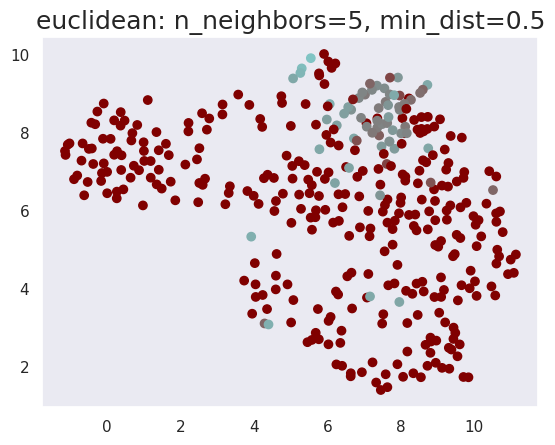

In [12]:
k = 5
min_dist = 0.5
umap_metric = 'euclidean'
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

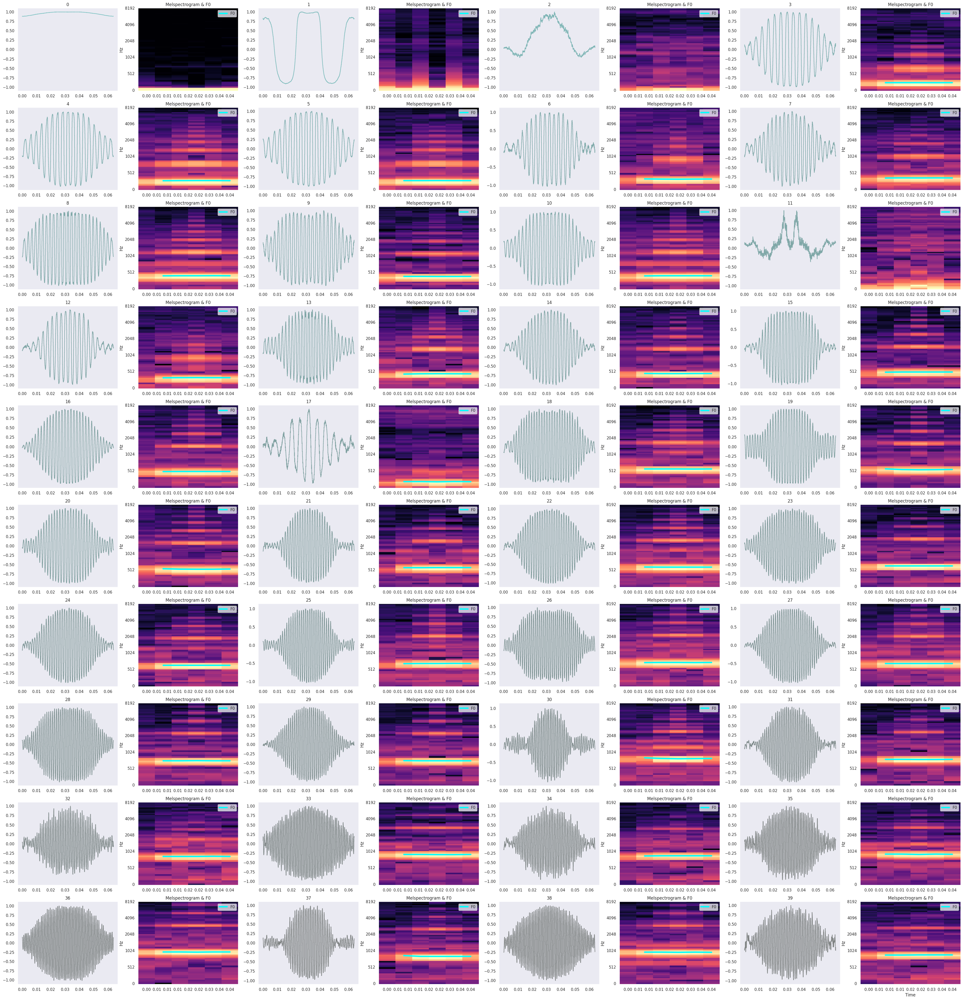

In [13]:
selected_emb_topk = torch.topk(zcs, 40)
selected_idx = selected_emb_topk.indices
visualize_speech_codebook(
    emb_data[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx])

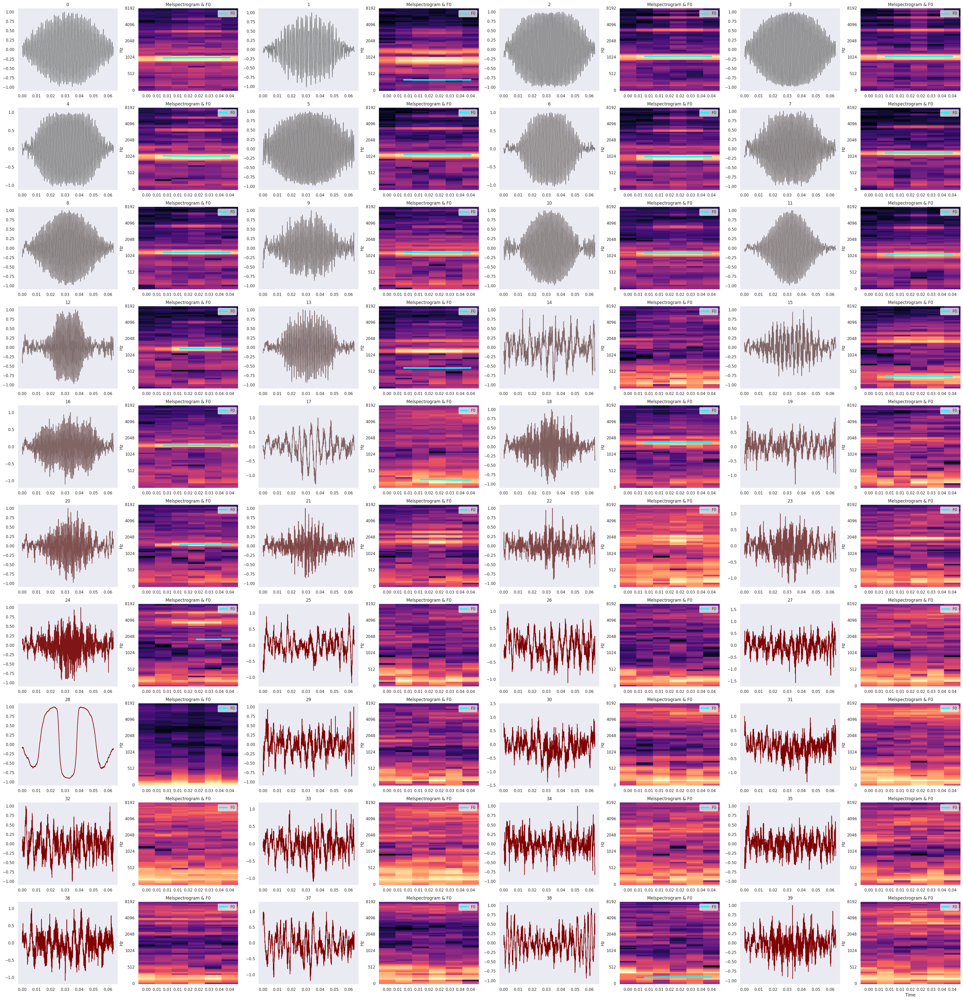

In [14]:
selected_emb_topk = torch.topk(zcs, 80)
selected_idx = selected_emb_topk.indices[-40:]
visualize_speech_codebook(
    emb_data[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx])

In [15]:
trainer.loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.1)
trainer.fit(n_epoch=10)

  4%|██                                                     | 0.37430167597765335/10 [00:37<16:20, 101.91s/it]

Epoch: 21	Loss: 408.890 [perplexity=7.422, loss_vq=398.937, loss_recon=9.828, loss_cls=1.250]	Val_acc: 0/27 (0.00%)



 10%|█████▊                                                    | 1.000000000000004/10 [01:33<07:17, 48.66s/it]

Correct: 39/135 (0.2889)
tensor([[ 0,  0,  3, 35],
        [ 0,  0,  6, 13],
        [ 0,  0,  9, 30],
        [ 0,  0,  9, 30]], device='cuda:0')


 14%|███████▌                                               | 1.379888268156432/10 [02:18<1:05:08, 453.44s/it]

Epoch: 22	Loss: 619.614 [perplexity=10.366, loss_vq=609.692, loss_recon=9.787, loss_cls=1.353]	Val_acc: 9/27 (33.33%)



 20%|███████████▌                                              | 2.000000000000013/10 [03:08<06:29, 48.72s/it]

Correct: 35/135 (0.2593)
tensor([[ 4,  0, 34,  0],
        [ 4,  0, 14,  1],
        [ 7,  0, 29,  3],
        [ 7,  0, 30,  2]], device='cuda:0')


 24%|█████████████▌                                           | 2.379888268156441/10 [03:53<57:46, 454.86s/it]

Epoch: 23	Loss: 75.851 [perplexity=5.555, loss_vq=70.680, loss_recon=5.046, loss_cls=1.246]	Val_acc: 0/27 (0.00%)



 30%|█████████████████                                        | 3.0000000000000218/10 [04:42<05:36, 48.10s/it]

Correct: 44/135 (0.3259)
tensor([[33,  0,  4,  1],
        [15,  0,  4,  0],
        [28,  1, 10,  0],
        [28,  0, 10,  1]], device='cuda:0')


 34%|██████████████████▉                                     | 3.3798882681564497/10 [05:27<50:42, 459.64s/it]

Epoch: 24	Loss: 222.359 [perplexity=6.648, loss_vq=212.330, loss_recon=9.870, loss_cls=1.585]	Val_acc: 9/27 (33.33%)



 40%|███████████████████████▌                                   | 4.00000000000003/10 [06:17<04:41, 46.88s/it]

Correct: 40/135 (0.2963)
tensor([[36,  0,  2,  0],
        [17,  0,  2,  0],
        [35,  0,  4,  0],
        [37,  0,  2,  0]], device='cuda:0')


 44%|████████████████████████▉                                | 4.374301675977687/10 [06:55<09:37, 102.62s/it]

Epoch: 25	Loss: 191.557 [perplexity=4.155, loss_vq=183.945, loss_recon=7.477, loss_cls=1.356]	Val_acc: 0/27 (0.00%)



 50%|█████████████████████████████                             | 5.000000000000039/10 [07:51<03:59, 47.89s/it]

Correct: 42/135 (0.3111)
tensor([[ 2,  0,  2, 34],
        [ 0,  0,  3, 16],
        [ 3,  0,  5, 31],
        [ 3,  0,  1, 35]], device='cuda:0')


 54%|██████████████████████████████▋                          | 5.379888268156467/10 [08:35<34:54, 453.43s/it]

Epoch: 26	Loss: 44.490 [perplexity=10.575, loss_vq=36.917, loss_recon=7.470, loss_cls=1.025]	Val_acc: 9/27 (33.33%)



 60%|██████████████████████████████████▊                       | 6.000000000000048/10 [09:25<03:12, 48.16s/it]

Correct: 43/135 (0.3185)
tensor([[36,  0,  2,  0],
        [16,  0,  3,  0],
        [34,  0,  5,  0],
        [35,  0,  2,  2]], device='cuda:0')


 64%|████████████████████████████████████▎                    | 6.379888268156476/10 [10:10<27:23, 453.95s/it]

Epoch: 27	Loss: 228.666 [perplexity=6.347, loss_vq=221.140, loss_recon=7.401, loss_cls=1.260]	Val_acc: 0/27 (0.00%)



 70%|████████████████████████████████████████▌                 | 7.000000000000057/10 [10:59<02:23, 47.70s/it]

Correct: 36/135 (0.2667)
tensor([[ 0,  0, 36,  2],
        [ 0,  0, 19,  0],
        [ 3,  0, 35,  1],
        [ 3,  0, 35,  1]], device='cuda:0')


 74%|██████████████████████████████████████████               | 7.379888268156485/10 [11:44<20:18, 464.95s/it]

Epoch: 28	Loss: 84.212 [perplexity=43.683, loss_vq=74.211, loss_recon=9.889, loss_cls=1.123]	Val_acc: 9/27 (33.33%)



 80%|██████████████████████████████████████████████▍           | 8.000000000000066/10 [12:34<01:35, 47.57s/it]

Correct: 44/135 (0.3259)
tensor([[33,  0,  2,  3],
        [16,  0,  3,  0],
        [30,  0,  7,  2],
        [26,  0,  9,  4]], device='cuda:0')


 84%|███████████████████████████████████████████████▊         | 8.379888268156494/10 [13:18<12:31, 463.80s/it]

Epoch: 29	Loss: 221.195 [perplexity=8.313, loss_vq=216.106, loss_recon=4.950, loss_cls=1.394]	Val_acc: 18/27 (66.67%)

Saved new best model: ../scb9_models/ravdess/model.epoch=29.step=2851.loss=221.195.val_acc=0.667.pt


 90%|████████████████████████████████████████████████████▏     | 9.000000000000075/10 [14:08<00:47, 47.98s/it]

Correct: 38/135 (0.2815)
tensor([[ 1,  0, 37,  0],
        [ 0,  0, 19,  0],
        [ 2,  0, 37,  0],
        [ 5,  0, 34,  0]], device='cuda:0')


 94%|█████████████████████████████████████████████████████▍   | 9.374301675977732/10 [14:45<01:02, 100.23s/it]

Epoch: 30	Loss: 420.490 [perplexity=13.584, loss_vq=415.429, loss_recon=4.902, loss_cls=1.592]	Val_acc: 9/27 (33.33%)



100%|█████████████████████████████████████████████████████████▉| 9.994413407821312/10 [15:42<00:00, 49.15s/it]/opt/anaconda3/envs/audio/lib/python3.9/site-packages/tqdm/std.py:639: TqdmWarning: clamping frac to range [0, 1]
  full_bar = Bar(frac,
100%|█████████████████████████████████████████████████████████| 10.000000000000083/10 [15:42<00:00, 94.28s/it]

Correct: 44/135 (0.3259)
tensor([[33,  0,  2,  3],
        [16,  0,  3,  0],
        [29,  0,  6,  4],
        [26,  0,  8,  5]], device='cuda:0')


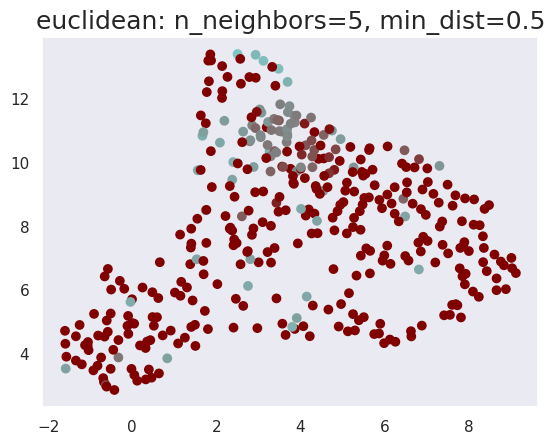

In [16]:
emb_data2 = trainer.model.embedding_filters.data.cpu()
emb_color2, zcs2 = get_embedding_color_v2(emb_data2)
k = 5
min_dist = 0.5
umap_metric = 'euclidean'
visualize_embedding_umap(emb_data2, colors=emb_color2, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

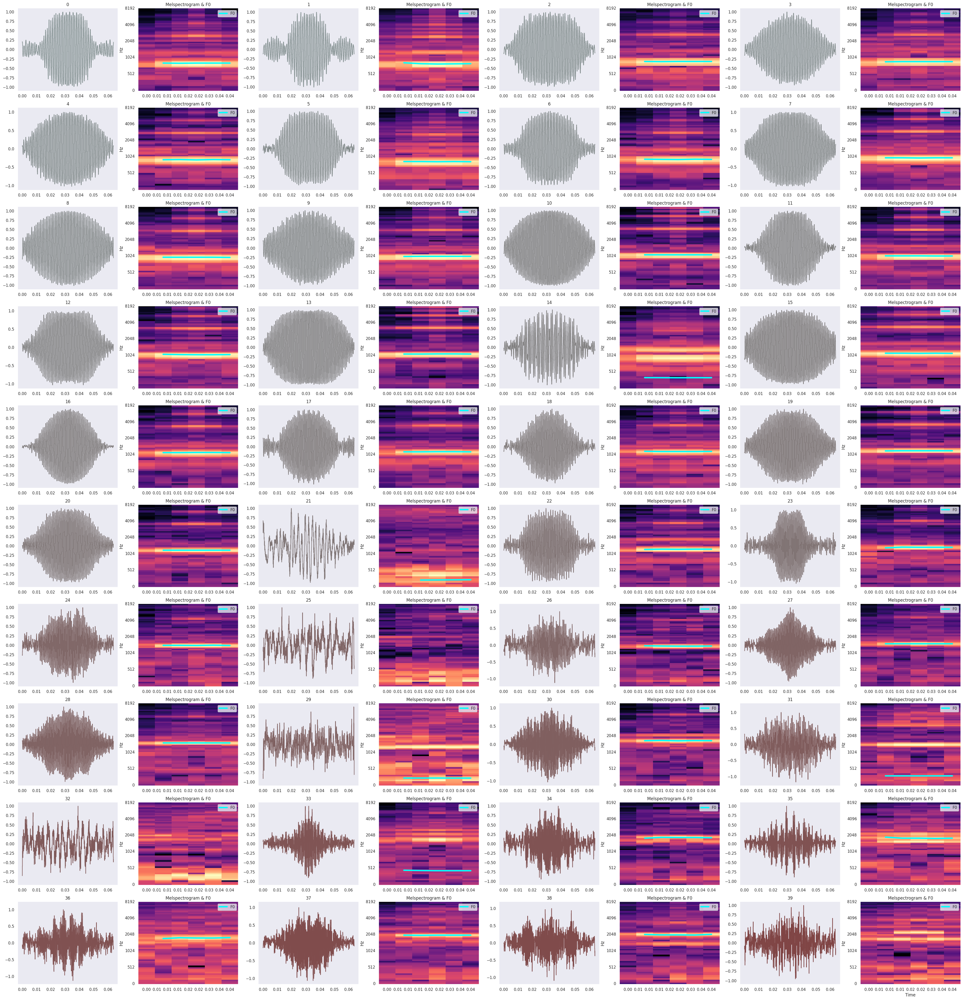

In [17]:
selected_emb_topk2 = torch.topk(zcs2, 80)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

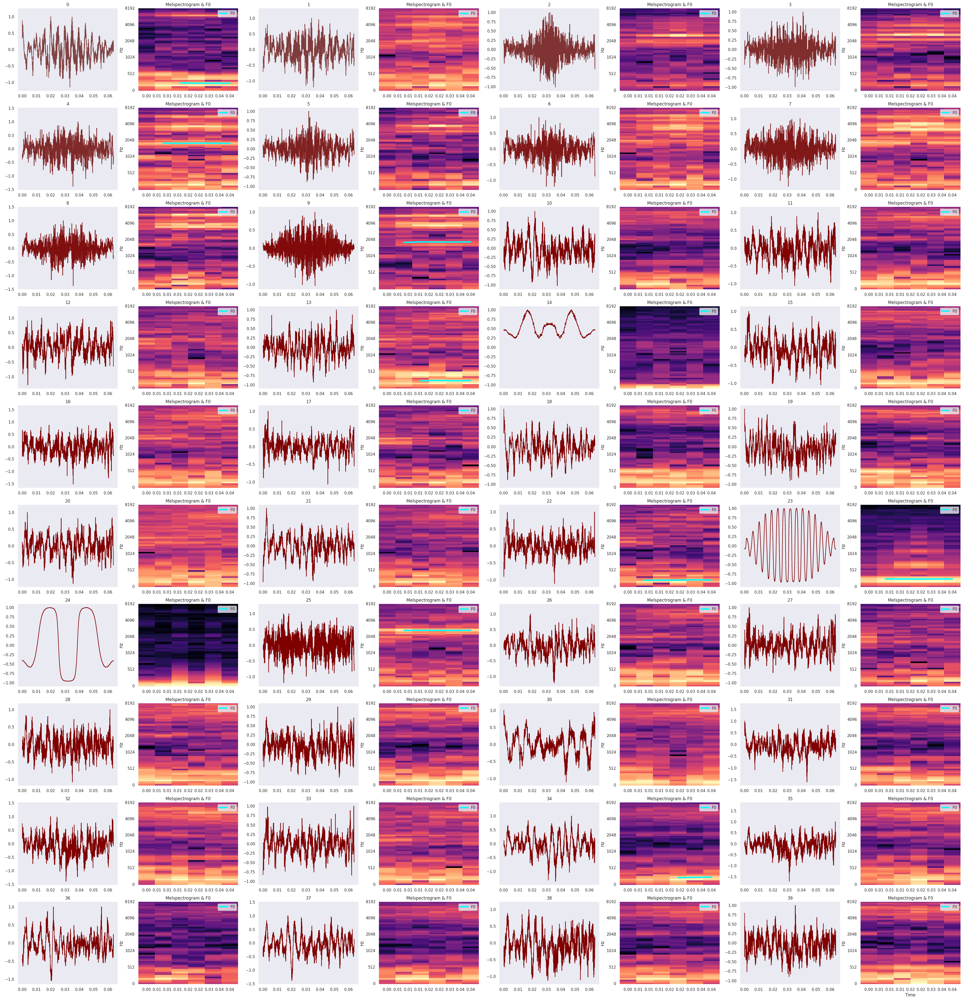

In [18]:
selected_emb_topk2 = torch.topk(zcs2, 120)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

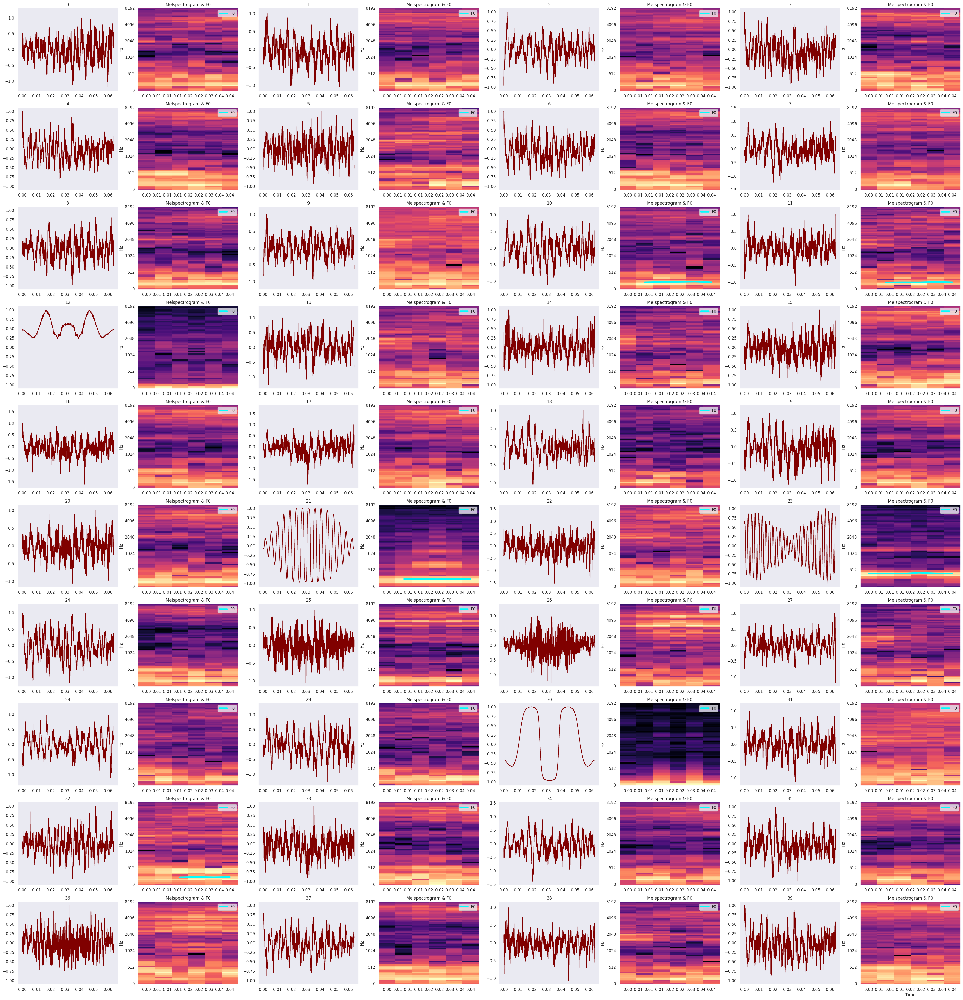

In [19]:
selected_emb_topk2 = torch.topk(zcs2, 160)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

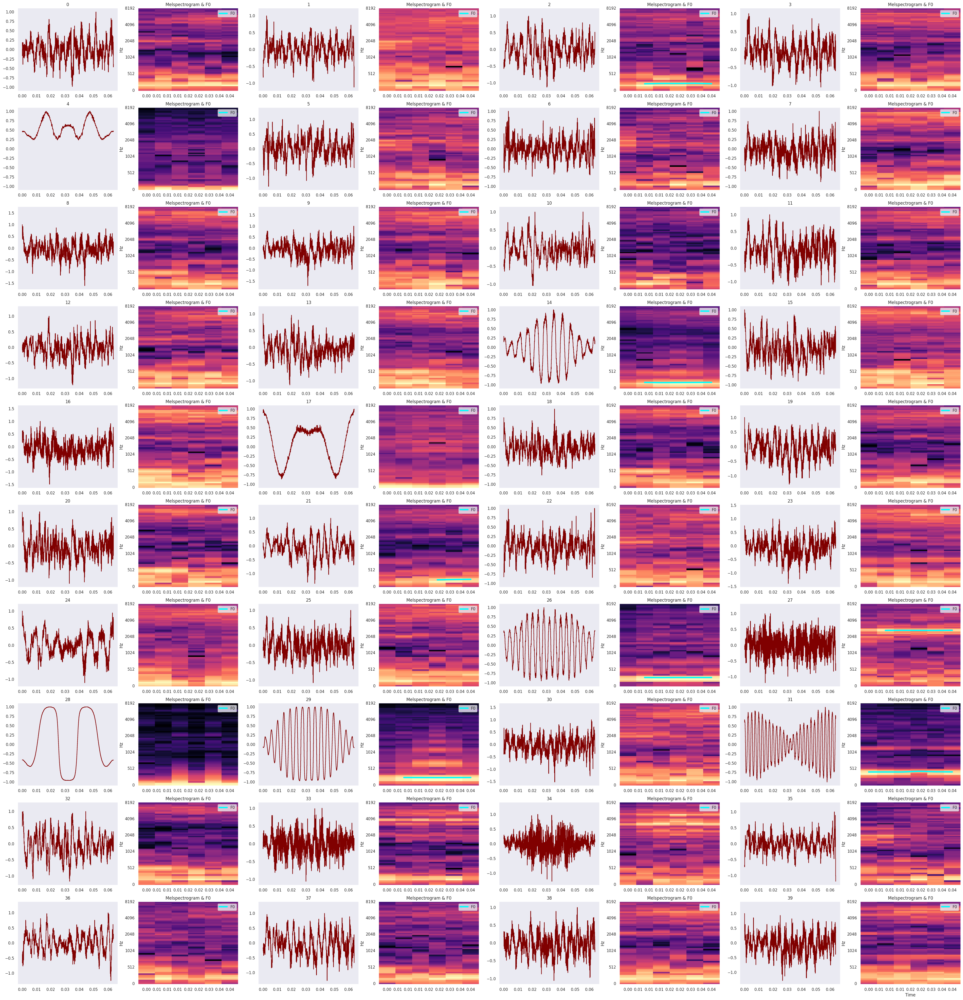

In [20]:
selected_emb_topk2 = torch.topk(zcs2, 200)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

In [21]:
for g in trainer.optimizer.param_groups:
    g['lr'] = 1e-4

In [22]:
trainer.total_batches = trainer.train_batches + trainer.test_batches
trainer.pbar_update = 1/trainer.total_batches
trainer.loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.1)
trainer.fit(n_epoch=1000)

  0%|                                                  | 0.3798882681564243/1000 [00:44<127:04:58, 457.67s/it]

Epoch: 31	Loss: 60.677 [perplexity=12.640, loss_vq=50.610, loss_recon=9.951, loss_cls=1.153]	Val_acc: 18/27 (66.67%)



  0%|                                                     | 1.000000000000004/1000 [01:33<13:23:05, 48.23s/it]

Correct: 46/135 (0.3407)
tensor([[35,  0,  3,  0],
        [16,  0,  3,  0],
        [29,  0,  9,  1],
        [29,  0,  8,  2]], device='cuda:0')


  0%|                                                   | 1.379888268156432/1000 [02:18<130:08:50, 469.18s/it]

Epoch: 32	Loss: 40.232 [perplexity=6.312, loss_vq=30.177, loss_recon=9.894, loss_cls=1.616]	Val_acc: 9/27 (33.33%)



  0%|                                                     | 2.000000000000013/1000 [03:08<13:29:18, 48.66s/it]

Correct: 40/135 (0.2963)
tensor([[ 0,  0,  2, 36],
        [ 0,  0,  1, 18],
        [ 0,  0,  5, 34],
        [ 0,  0,  4, 35]], device='cuda:0')


  0%|                                                   | 2.379888268156441/1000 [03:52<126:28:33, 456.40s/it]

Epoch: 33	Loss: 82.028 [perplexity=28.584, loss_vq=76.863, loss_recon=5.047, loss_cls=1.184]	Val_acc: 0/27 (0.00%)



  0%|▏                                                   | 3.0000000000000218/1000 [04:42<13:17:41, 48.01s/it]

Correct: 41/135 (0.3037)
tensor([[ 0,  0,  1, 37],
        [ 0,  0,  0, 19],
        [ 0,  0,  2, 37],
        [ 0,  0,  0, 39]], device='cuda:0')


  0%|▏                                                 | 3.3798882681564497/1000 [05:27<126:59:36, 458.73s/it]

Epoch: 34	Loss: 291.893 [perplexity=12.658, loss_vq=284.364, loss_recon=7.426, loss_cls=1.029]	Val_acc: 9/27 (33.33%)



  0%|▏                                                     | 4.00000000000003/1000 [06:16<13:30:16, 48.81s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  3,  0],
        [14,  0,  3,  2],
        [30,  0,  6,  3],
        [29,  0,  8,  2]], device='cuda:0')


  0%|▏                                                  | 4.379888268156458/1000 [07:00<128:37:57, 465.11s/it]

Epoch: 35	Loss: 219.827 [perplexity=18.868, loss_vq=212.271, loss_recon=7.433, loss_cls=1.228]	Val_acc: 18/27 (66.67%)



  1%|▎                                                    | 5.000000000000039/1000 [07:50<13:08:00, 47.52s/it]

Correct: 39/135 (0.2889)
tensor([[ 0,  0, 38,  0],
        [ 0,  0, 19,  0],
        [ 0,  0, 37,  2],
        [ 0,  0, 37,  2]], device='cuda:0')


  1%|▎                                                  | 5.379888268156467/1000 [08:36<128:40:06, 465.71s/it]

Epoch: 36	Loss: 206.475 [perplexity=30.479, loss_vq=201.394, loss_recon=4.947, loss_cls=1.344]	Val_acc: 0/27 (0.00%)



  1%|▎                                                    | 6.000000000000048/1000 [09:26<13:08:20, 47.59s/it]

Correct: 45/135 (0.3333)
tensor([[35,  0,  1,  2],
        [16,  0,  1,  2],
        [32,  0,  5,  2],
        [30,  0,  4,  5]], device='cuda:0')


  1%|▎                                                  | 6.379888268156476/1000 [10:11<130:56:56, 474.44s/it]

Epoch: 37	Loss: 43.050 [perplexity=17.149, loss_vq=33.118, loss_recon=9.843, loss_cls=0.899]	Val_acc: 0/27 (0.00%)



  1%|▎                                                    | 7.000000000000057/1000 [11:02<13:16:33, 48.13s/it]

Correct: 45/135 (0.3333)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  5,  4],
        [29,  0,  5,  5]], device='cuda:0')


  1%|▍                                                   | 7.374301675977714/1000 [11:40<28:52:02, 104.69s/it]

Epoch: 38	Loss: 173.158 [perplexity=43.355, loss_vq=173.000, loss_recon=0.030, loss_cls=1.287]	Val_acc: 9/27 (33.33%)



  1%|▍                                                    | 8.000000000000066/1000 [12:37<13:19:48, 48.38s/it]

Correct: 45/135 (0.3333)
tensor([[35,  0,  2,  1],
        [14,  0,  1,  4],
        [30,  0,  4,  5],
        [29,  0,  4,  6]], device='cuda:0')


  1%|▍                                                  | 8.379888268156494/1000 [13:23<128:12:29, 465.45s/it]

Epoch: 39	Loss: 346.524 [perplexity=17.774, loss_vq=341.443, loss_recon=4.980, loss_cls=1.013]	Val_acc: 18/27 (66.67%)



  1%|▍                                                    | 9.000000000000075/1000 [14:12<13:34:03, 49.29s/it]

Correct: 39/135 (0.2889)
tensor([[ 0,  1,  0, 37],
        [ 0,  1,  0, 18],
        [ 0,  2,  3, 34],
        [ 0,  1,  3, 35]], device='cuda:0')


  1%|▍                                                  | 9.379888268156503/1000 [14:58<128:43:27, 467.80s/it]

Epoch: 40	Loss: 428.312 [perplexity=20.781, loss_vq=420.630, loss_recon=7.561, loss_cls=1.210]	Val_acc: 18/27 (66.67%)



  1%|▌                                                   | 10.000000000000083/1000 [15:47<13:27:13, 48.92s/it]

Correct: 41/135 (0.3037)
tensor([[35,  0,  3,  0],
        [14,  0,  5,  0],
        [32,  0,  6,  1],
        [31,  0,  8,  0]], device='cuda:0')


  1%|▌                                                 | 10.379888268156511/1000 [16:32<128:53:03, 468.85s/it]

Epoch: 41	Loss: 3432.588 [perplexity=10.286, loss_vq=3427.375, loss_recon=5.105, loss_cls=1.085]	Val_acc: 18/27 (66.67%)



  1%|▌                                                   | 11.000000000000092/1000 [17:22<13:01:15, 47.40s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  2,  7],
        [29,  0,  3,  7]], device='cuda:0')


  1%|▌                                                    | 11.37430167597775/1000 [18:00<27:23:20, 99.73s/it]

Epoch: 42	Loss: 1503.003 [perplexity=17.013, loss_vq=1495.480, loss_recon=7.389, loss_cls=1.339]	Val_acc: 9/27 (33.33%)



  1%|▌                                                   | 12.000000000000101/1000 [18:57<13:14:56, 48.28s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  3,  0],
        [14,  0,  4,  1],
        [30,  0,  7,  2],
        [29,  0,  9,  1]], device='cuda:0')


  1%|▋                                                  | 12.37988826815653/1000 [19:42<128:14:16, 467.44s/it]

Epoch: 43	Loss: 236.780 [perplexity=22.916, loss_vq=234.134, loss_recon=2.517, loss_cls=1.288]	Val_acc: 0/27 (0.00%)



  1%|▋                                                    | 13.00000000000011/1000 [20:32<13:05:19, 47.74s/it]

Correct: 45/135 (0.3333)
tensor([[35,  0,  2,  1],
        [15,  0,  2,  2],
        [30,  0,  5,  4],
        [29,  0,  5,  5]], device='cuda:0')


  1%|▋                                                 | 13.379888268156538/1000 [21:17<126:36:40, 461.98s/it]

Epoch: 44	Loss: 16.878 [perplexity=9.160, loss_vq=14.266, loss_recon=2.505, loss_cls=1.075]	Val_acc: 9/27 (33.33%)



  1%|▋                                                   | 14.000000000000119/1000 [22:06<13:16:33, 48.47s/it]

Correct: 37/135 (0.2741)
tensor([[ 1,  0, 37,  0],
        [ 2,  0, 15,  2],
        [ 4,  0, 35,  0],
        [ 4,  0, 34,  1]], device='cuda:0')


  1%|▋                                                 | 14.379888268156547/1000 [22:52<127:33:43, 465.92s/it]

Epoch: 45	Loss: 472.347 [perplexity=22.267, loss_vq=462.431, loss_recon=9.799, loss_cls=1.172]	Val_acc: 9/27 (33.33%)



  2%|▊                                                   | 15.000000000000128/1000 [23:41<12:58:02, 47.39s/it]

Correct: 39/135 (0.2889)
tensor([[ 0,  0,  2, 36],
        [ 0,  0,  1, 18],
        [ 1,  0,  5, 33],
        [ 1,  0,  4, 34]], device='cuda:0')


  2%|▊                                                 | 15.379888268156556/1000 [24:26<127:13:01, 465.14s/it]

Epoch: 46	Loss: 1557.067 [perplexity=21.161, loss_vq=1549.532, loss_recon=7.385, loss_cls=1.497]	Val_acc: 18/27 (66.67%)



  2%|▊                                                   | 16.000000000000135/1000 [25:16<13:07:59, 48.05s/it]

Correct: 38/135 (0.2815)
tensor([[ 0,  0,  2, 36],
        [ 0,  0,  3, 16],
        [ 0,  0,  5, 34],
        [ 0,  0,  6, 33]], device='cuda:0')


  2%|▊                                                  | 16.374301675977673/1000 [25:53<28:36:37, 104.71s/it]

Epoch: 47	Loss: 92.421 [perplexity=44.014, loss_vq=89.773, loss_recon=2.533, loss_cls=1.160]	Val_acc: 18/27 (66.67%)



  2%|▉                                                   | 16.999999999999826/1000 [26:50<13:03:27, 47.82s/it]

Correct: 46/135 (0.3407)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  5,  4],
        [29,  0,  4,  6]], device='cuda:0')


  2%|▉                                                   | 17.374301675977364/1000 [27:28<27:02:13, 99.05s/it]

Epoch: 48	Loss: 1085.801 [perplexity=22.898, loss_vq=1075.845, loss_recon=9.850, loss_cls=1.066]	Val_acc: 9/27 (33.33%)



  2%|▉                                                   | 17.999999999999517/1000 [28:25<13:15:19, 48.59s/it]

Correct: 40/135 (0.2963)
tensor([[ 0,  0,  1, 37],
        [ 0,  0,  0, 19],
        [ 0,  0,  2, 37],
        [ 0,  0,  1, 38]], device='cuda:0')


  2%|▉                                                 | 18.379888268155824/1000 [29:11<125:38:58, 460.81s/it]

Epoch: 49	Loss: 55.898 [perplexity=25.420, loss_vq=48.292, loss_recon=7.461, loss_cls=1.448]	Val_acc: 9/27 (33.33%)



  2%|▉                                                   | 18.999999999999208/1000 [30:01<13:14:38, 48.60s/it]

Correct: 37/135 (0.2741)
tensor([[ 0,  0,  1, 37],
        [ 0,  0,  1, 18],
        [ 0,  0,  2, 37],
        [ 0,  0,  4, 35]], device='cuda:0')


  2%|█                                                   | 19.374301675976746/1000 [30:38<26:41:28, 97.99s/it]

Epoch: 50	Loss: 12.748 [perplexity=2.087, loss_vq=7.628, loss_recon=5.018, loss_cls=1.014]	Val_acc: 9/27 (33.33%)



  2%|█                                                     | 19.9999999999989/1000 [31:35<12:52:42, 47.31s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  2,  7],
        [29,  0,  4,  6]], device='cuda:0')


  2%|█                                                 | 20.379888268155206/1000 [32:20<125:56:09, 462.80s/it]

Epoch: 51	Loss: 1818.441 [perplexity=14.108, loss_vq=1808.534, loss_recon=9.801, loss_cls=1.064]	Val_acc: 9/27 (33.33%)



  2%|█                                                    | 20.99999999999859/1000 [33:10<13:00:57, 47.86s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [14,  0,  4,  1],
        [30,  0,  4,  5],
        [29,  0,  5,  5]], device='cuda:0')


  2%|█                                                 | 21.379888268154897/1000 [33:54<125:42:21, 462.43s/it]

Epoch: 52	Loss: 100.177 [perplexity=11.638, loss_vq=95.040, loss_recon=5.052, loss_cls=0.847]	Val_acc: 9/27 (33.33%)



  2%|█▏                                                   | 21.99999999999828/1000 [34:44<12:58:31, 47.76s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  2,  7],
        [29,  0,  4,  6]], device='cuda:0')


  2%|█                                                 | 22.379888268154588/1000 [35:29<127:01:47, 467.78s/it]

Epoch: 53	Loss: 440.957 [perplexity=2.291, loss_vq=433.450, loss_recon=7.385, loss_cls=1.217]	Val_acc: 9/27 (33.33%)



  2%|█▏                                                   | 22.99999999999797/1000 [36:19<13:12:52, 48.69s/it]

Correct: 41/135 (0.3037)
tensor([[36,  0,  2,  0],
        [15,  0,  4,  0],
        [33,  0,  4,  2],
        [33,  0,  5,  1]], device='cuda:0')


  2%|█▏                                                 | 23.37988826815428/1000 [37:04<123:06:02, 453.77s/it]

Epoch: 54	Loss: 803.670 [perplexity=19.589, loss_vq=793.664, loss_recon=9.884, loss_cls=1.217]	Val_acc: 18/27 (66.67%)



  2%|█▏                                                  | 23.999999999997662/1000 [37:54<13:05:23, 48.28s/it]

Correct: 35/135 (0.2593)
tensor([[ 2,  0, 36,  0],
        [ 4,  0, 15,  0],
        [ 6,  0, 33,  0],
        [ 6,  0, 33,  0]], device='cuda:0')


  2%|█▎                                                   | 24.3743016759752/1000 [38:32<28:09:36, 103.91s/it]

Epoch: 55	Loss: 599.661 [perplexity=9.985, loss_vq=594.622, loss_recon=4.930, loss_cls=1.095]	Val_acc: 9/27 (33.33%)



  2%|█▎                                                  | 24.999999999997353/1000 [39:29<13:06:39, 48.41s/it]

Correct: 39/135 (0.2889)
tensor([[37,  0,  1,  0],
        [18,  0,  1,  0],
        [37,  0,  2,  0],
        [36,  0,  3,  0]], device='cuda:0')


  3%|█▎                                                 | 25.37988826815366/1000 [40:13<125:53:03, 464.98s/it]

Epoch: 56	Loss: 96.756 [perplexity=14.340, loss_vq=86.719, loss_recon=9.894, loss_cls=1.427]	Val_acc: 18/27 (66.67%)



  3%|█▎                                                  | 25.999999999997044/1000 [41:03<12:58:07, 47.93s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  2,  7],
        [29,  0,  4,  6]], device='cuda:0')


  3%|█▎                                                 | 26.37988826815335/1000 [41:49<125:38:12, 464.55s/it]

Epoch: 57	Loss: 88.732 [perplexity=12.231, loss_vq=81.148, loss_recon=7.486, loss_cls=0.972]	Val_acc: 9/27 (33.33%)



  3%|█▍                                                  | 26.999999999996735/1000 [42:38<12:56:17, 47.87s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [14,  0,  4,  1],
        [30,  0,  4,  5],
        [29,  0,  5,  5]], device='cuda:0')


  3%|█▎                                                | 27.379888268153042/1000 [43:23<125:07:18, 463.12s/it]

Epoch: 58	Loss: 292.854 [perplexity=16.396, loss_vq=287.678, loss_recon=5.036, loss_cls=1.398]	Val_acc: 18/27 (66.67%)



  3%|█▍                                                  | 27.999999999996426/1000 [44:12<12:50:48, 47.58s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  3,  6],
        [29,  0,  4,  6]], device='cuda:0')


  3%|█▍                                                | 28.379888268152733/1000 [44:56<126:19:01, 468.02s/it]

Epoch: 59	Loss: 81.323 [perplexity=6.382, loss_vq=73.691, loss_recon=7.452, loss_cls=1.806]	Val_acc: 18/27 (66.67%)



  3%|█▌                                                  | 28.999999999996117/1000 [45:46<12:56:05, 47.96s/it]

Correct: 39/135 (0.2889)
tensor([[ 0,  2, 35,  1],
        [ 0,  1, 18,  0],
        [ 0,  2, 34,  3],
        [ 0,  4, 31,  4]], device='cuda:0')


  3%|█▍                                                | 29.379888268152424/1000 [46:31<123:31:10, 458.13s/it]

Epoch: 60	Loss: 692.159 [perplexity=7.354, loss_vq=682.135, loss_recon=9.892, loss_cls=1.328]	Val_acc: 9/27 (33.33%)



  3%|█▌                                                  | 29.999999999995808/1000 [47:21<13:06:16, 48.64s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [15,  0,  3,  1],
        [30,  0,  4,  5],
        [29,  0,  5,  5]], device='cuda:0')


  3%|█▌                                                | 30.379888268152115/1000 [48:06<122:44:48, 455.73s/it]

Epoch: 61	Loss: 361.583 [perplexity=13.934, loss_vq=354.076, loss_recon=7.349, loss_cls=1.585]	Val_acc: 9/27 (33.33%)



  3%|█▋                                                    | 30.9999999999955/1000 [48:55<12:51:35, 47.78s/it]

Correct: 41/135 (0.3037)
tensor([[ 0,  0, 37,  1],
        [ 0,  0, 16,  3],
        [ 0,  0, 35,  4],
        [ 0,  0, 33,  6]], device='cuda:0')


  3%|█▌                                                | 31.379888268151806/1000 [49:41<124:27:31, 462.57s/it]

Epoch: 62	Loss: 1509.524 [perplexity=18.226, loss_vq=1504.493, loss_recon=4.918, loss_cls=1.129]	Val_acc: 18/27 (66.67%)



  3%|█▋                                                   | 31.99999999999519/1000 [50:30<12:56:41, 48.14s/it]

Correct: 39/135 (0.2889)
tensor([[ 1,  0, 37,  0],
        [ 0,  0, 16,  3],
        [ 2,  0, 34,  3],
        [ 2,  1, 32,  4]], device='cuda:0')


  3%|█▋                                                 | 32.374301675972966/1000 [51:07<26:55:15, 100.16s/it]Traceback (most recent call last):
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/opt/anaconda3/envs/audio/lib/python3.9/shutil.py", line 740, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/opt/anaconda3/envs/audio/lib/python3.9/shutil.py", line 738, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-cwhntyux'
  3%|█▋                                                 | 32.37988826815174/1000 [51:15<124:12:38, 462.12s/it]

Epoch: 63	Loss: 89.874 [perplexity=17.361, loss_vq=84.738, loss_recon=5.025, loss_cls=1.116]	Val_acc: 18/27 (66.67%)



  3%|█▋                                                   | 32.99999999999552/1000 [52:05<12:53:23, 47.99s/it]

Correct: 45/135 (0.3333)
tensor([[35,  1,  1,  1],
        [14,  0,  2,  3],
        [30,  1,  4,  4],
        [29,  1,  3,  6]], device='cuda:0')


  3%|█▋                                                  | 33.37430167597329/1000 [52:43<28:11:19, 104.98s/it]Traceback (most recent call last):
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/opt/anaconda3/envs/audio/lib/python3.9/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/opt/anaconda3/envs/audio/lib/python3.9/shutil.py", line 740, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/opt/anaconda3/envs/audio/lib/python3.9/shutil.py", line 738, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-voa7lo78'
  3%|█▋                                                | 33.379888268152065/1000 [52:50<124:36:43, 464.09s/it]

Epoch: 64	Loss: 163.317 [perplexity=26.685, loss_vq=155.777, loss_recon=7.457, loss_cls=0.831]	Val_acc: 9/27 (33.33%)



  3%|█▊                                                   | 33.99999999999584/1000 [53:40<12:55:25, 48.16s/it]

Correct: 39/135 (0.2889)
tensor([[36,  0,  2,  0],
        [14,  0,  2,  3],
        [35,  0,  2,  2],
        [34,  0,  4,  1]], device='cuda:0')


  3%|█▊                                                 | 34.37988826815239/1000 [54:25<125:42:15, 468.65s/it]

Epoch: 65	Loss: 128.137 [perplexity=19.607, loss_vq=118.064, loss_recon=9.980, loss_cls=0.926]	Val_acc: 18/27 (66.67%)



  3%|█▊                                                   | 34.99999999999617/1000 [55:15<12:45:37, 47.60s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  3,  2],
        [30,  1,  2,  6],
        [29,  0,  4,  6]], device='cuda:0')


  4%|█▊                                                 | 35.37988826815272/1000 [56:00<124:22:11, 464.15s/it]

Epoch: 66	Loss: 69.088 [perplexity=23.636, loss_vq=59.018, loss_recon=9.922, loss_cls=1.485]	Val_acc: 9/27 (33.33%)



  4%|█▉                                                    | 35.9999999999965/1000 [56:49<12:54:35, 48.21s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [15,  0,  0,  4],
        [30,  2,  1,  6],
        [29,  2,  1,  7]], device='cuda:0')


  4%|█▊                                                | 36.379888268153046/1000 [57:34<123:47:39, 462.48s/it]

Epoch: 67	Loss: 143.689 [perplexity=11.966, loss_vq=136.041, loss_recon=7.485, loss_cls=1.641]	Val_acc: 18/27 (66.67%)



  4%|█▉                                                  | 36.999999999996824/1000 [58:24<12:52:07, 48.11s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [30,  0,  2,  7],
        [29,  0,  4,  6]], device='cuda:0')


  4%|█▉                                                 | 37.37988826815337/1000 [59:09<123:24:25, 461.52s/it]

Epoch: 68	Loss: 891.653 [perplexity=21.412, loss_vq=886.561, loss_recon=4.957, loss_cls=1.347]	Val_acc: 18/27 (66.67%)



  4%|██                                                   | 37.99999999999715/1000 [59:59<12:52:49, 48.20s/it]

Correct: 42/135 (0.3111)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [32,  0,  2,  5],
        [30,  0,  4,  5]], device='cuda:0')


  4%|█▉                                                | 38.3798882681537/1000 [1:00:44<126:39:29, 474.17s/it]

Epoch: 69	Loss: 31.142 [perplexity=5.584, loss_vq=26.041, loss_recon=4.992, loss_cls=1.087]	Val_acc: 9/27 (33.33%)



  4%|█▉                                                 | 38.99999999999748/1000 [1:01:33<12:45:47, 47.81s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  1,  4],
        [30,  0,  2,  7],
        [29,  0,  4,  6]], device='cuda:0')


  4%|█▉                                              | 39.379888268154026/1000 [1:02:17<122:24:04, 458.71s/it]

Epoch: 70	Loss: 126.587 [perplexity=8.792, loss_vq=121.395, loss_recon=5.134, loss_cls=0.583]	Val_acc: 9/27 (33.33%)



  4%|█▉                                                | 39.999999999997804/1000 [1:03:08<13:04:29, 49.03s/it]

Correct: 42/135 (0.3111)
tensor([[36,  0,  1,  1],
        [17,  0,  0,  2],
        [34,  0,  2,  3],
        [32,  0,  3,  4]], device='cuda:0')


  4%|█▉                                               | 40.37988826815435/1000 [1:03:52<121:12:54, 454.74s/it]

Epoch: 71	Loss: 147.893 [perplexity=23.999, loss_vq=145.128, loss_recon=2.657, loss_cls=1.076]	Val_acc: 9/27 (33.33%)



  4%|██                                                 | 40.99999999999813/1000 [1:04:42<12:44:59, 47.86s/it]

Correct: 42/135 (0.3111)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  1,  1,  8],
        [29,  0,  4,  6]], device='cuda:0')


  4%|██                                               | 41.37988826815468/1000 [1:05:28<124:43:52, 468.42s/it]

Epoch: 72	Loss: 21.144 [perplexity=9.718, loss_vq=20.978, loss_recon=0.042, loss_cls=1.236]	Val_acc: 18/27 (66.67%)



  4%|██▏                                                | 41.99999999999846/1000 [1:06:16<12:41:52, 47.72s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [14,  0,  2,  3],
        [29,  0,  3,  7],
        [29,  0,  4,  6]], device='cuda:0')


  4%|██                                               | 42.37988826815501/1000 [1:07:01<123:28:12, 464.16s/it]

Epoch: 73	Loss: 41.021 [perplexity=23.882, loss_vq=33.397, loss_recon=7.485, loss_cls=1.392]	Val_acc: 18/27 (66.67%)



  4%|██▏                                               | 42.999999999998785/1000 [1:07:51<12:48:52, 48.21s/it]

Correct: 41/135 (0.3037)
tensor([[35,  1,  0,  2],
        [14,  0,  2,  3],
        [29,  2,  0,  8],
        [29,  2,  2,  6]], device='cuda:0')


  4%|██                                              | 43.379888268155334/1000 [1:08:36<123:07:32, 463.35s/it]

Epoch: 74	Loss: 75.787 [perplexity=9.156, loss_vq=68.225, loss_recon=7.457, loss_cls=1.045]	Val_acc: 18/27 (66.67%)



  4%|██▏                                                | 43.99999999999911/1000 [1:09:26<12:41:13, 47.78s/it]

Correct: 37/135 (0.2741)
tensor([[ 0,  0, 37,  1],
        [ 0,  0, 18,  1],
        [ 0,  0, 32,  7],
        [ 0,  0, 34,  5]], device='cuda:0')


  4%|██▏                                              | 44.37988826815566/1000 [1:10:11<122:10:14, 460.24s/it]

Epoch: 75	Loss: 681.354 [perplexity=14.035, loss_vq=671.348, loss_recon=9.854, loss_cls=1.527]	Val_acc: 18/27 (66.67%)



  4%|██▎                                                | 44.99999999999944/1000 [1:11:01<12:53:05, 48.57s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  2,  1],
        [14,  0,  2,  3],
        [29,  0,  2,  8],
        [29,  0,  4,  6]], device='cuda:0')


  5%|██▏                                              | 45.37988826815599/1000 [1:11:46<122:19:14, 461.29s/it]

Epoch: 76	Loss: 296.384 [perplexity=5.341, loss_vq=296.058, loss_recon=0.220, loss_cls=1.056]	Val_acc: 18/27 (66.67%)



  5%|██▎                                               | 45.999999999999766/1000 [1:12:35<12:45:12, 48.13s/it]

Correct: 38/135 (0.2815)
tensor([[ 0,  0,  2, 36],
        [ 0,  0,  2, 17],
        [ 0,  0,  3, 36],
        [ 0,  0,  4, 35]], device='cuda:0')


  5%|██▏                                             | 46.379888268156314/1000 [1:13:20<123:39:35, 466.83s/it]

Epoch: 77	Loss: 47.152 [perplexity=12.420, loss_vq=42.149, loss_recon=4.898, loss_cls=1.048]	Val_acc: 9/27 (33.33%)



  5%|██▍                                                | 47.00000000000009/1000 [1:14:10<12:44:48, 48.15s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  2,  1],
        [14,  0,  4,  1],
        [29,  0,  2,  8],
        [29,  0,  4,  6]], device='cuda:0')


  5%|██▎                                              | 47.37988826815664/1000 [1:14:55<121:30:01, 459.16s/it]

Epoch: 78	Loss: 88.273 [perplexity=17.597, loss_vq=85.658, loss_recon=2.516, loss_cls=0.988]	Val_acc: 9/27 (33.33%)



  5%|██▍                                                | 48.00000000000042/1000 [1:15:45<13:01:24, 49.25s/it]

Correct: 41/135 (0.3037)
tensor([[35,  1,  0,  2],
        [14,  0,  2,  3],
        [29,  2,  0,  8],
        [29,  2,  2,  6]], device='cuda:0')


  5%|██▎                                              | 48.37988826815697/1000 [1:16:31<122:50:54, 464.74s/it]

Epoch: 79	Loss: 45.965 [perplexity=5.782, loss_vq=45.831, loss_recon=0.078, loss_cls=0.562]	Val_acc: 18/27 (66.67%)



  5%|██▍                                               | 49.000000000000746/1000 [1:17:20<12:46:21, 48.35s/it]

Correct: 38/135 (0.2815)
tensor([[ 0,  0, 36,  2],
        [ 0,  0, 16,  3],
        [ 0,  1, 32,  6],
        [ 0,  0, 33,  6]], device='cuda:0')


  5%|██▎                                             | 49.379888268157295/1000 [1:18:05<120:00:17, 454.46s/it]

Epoch: 80	Loss: 1356.695 [perplexity=14.957, loss_vq=1351.395, loss_recon=5.179, loss_cls=1.210]	Val_acc: 18/27 (66.67%)



  5%|██▌                                                | 50.00000000000107/1000 [1:18:55<12:41:58, 48.12s/it]

Correct: 42/135 (0.3111)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  1,  1,  8],
        [29,  0,  4,  6]], device='cuda:0')


  5%|██▍                                              | 50.37988826815762/1000 [1:19:39<120:44:37, 457.74s/it]

Epoch: 81	Loss: 235.440 [perplexity=12.303, loss_vq=230.316, loss_recon=5.003, loss_cls=1.203]	Val_acc: 18/27 (66.67%)



  5%|██▋                                                 | 51.0000000000014/1000 [1:20:29<12:37:53, 47.92s/it]

Correct: 41/135 (0.3037)
tensor([[37,  0,  1,  0],
        [17,  0,  2,  0],
        [35,  0,  3,  1],
        [34,  0,  4,  1]], device='cuda:0')


  5%|██▌                                              | 51.37988826815795/1000 [1:21:14<121:47:10, 462.18s/it]

Epoch: 82	Loss: 34.747 [perplexity=16.585, loss_vq=29.652, loss_recon=4.992, loss_cls=1.024]	Val_acc: 18/27 (66.67%)



  5%|██▋                                                | 52.00000000000173/1000 [1:22:03<12:43:16, 48.31s/it]

Correct: 38/135 (0.2815)
tensor([[ 0,  0, 36,  2],
        [ 0,  0, 14,  5],
        [ 0,  0, 31,  8],
        [ 0,  0, 32,  7]], device='cuda:0')


  5%|██▌                                             | 52.379888268158275/1000 [1:22:48<121:02:39, 459.85s/it]

Epoch: 83	Loss: 1580.451 [perplexity=10.191, loss_vq=1577.413, loss_recon=2.933, loss_cls=1.044]	Val_acc: 18/27 (66.67%)



  5%|██▋                                                | 53.00000000000205/1000 [1:23:38<12:46:43, 48.58s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  0,  3,  7],
        [29,  0,  4,  6]], device='cuda:0')


  5%|██▋                                               | 53.3798882681586/1000 [1:24:23<122:04:31, 464.25s/it]

Epoch: 84	Loss: 184.149 [perplexity=18.723, loss_vq=179.089, loss_recon=4.925, loss_cls=1.358]	Val_acc: 9/27 (33.33%)



  5%|██▊                                                | 54.00000000000238/1000 [1:25:13<12:34:51, 47.88s/it]

Correct: 45/135 (0.3333)
tensor([[35,  0,  1,  2],
        [14,  0,  0,  5],
        [29,  0,  2,  8],
        [29,  0,  2,  8]], device='cuda:0')


  5%|██▋                                              | 54.37988826815893/1000 [1:25:58<121:46:04, 463.57s/it]

Epoch: 85	Loss: 194.335 [perplexity=5.869, loss_vq=184.291, loss_recon=9.920, loss_cls=1.245]	Val_acc: 18/27 (66.67%)



  6%|██▊                                                | 55.00000000000271/1000 [1:26:47<12:41:04, 48.32s/it]

Correct: 37/135 (0.2741)
tensor([[ 0,  0, 36,  2],
        [ 0,  0, 15,  4],
        [ 0,  0, 31,  8],
        [ 0,  0, 33,  6]], device='cuda:0')


  6%|██▋                                             | 55.379888268159256/1000 [1:27:33<124:10:38, 473.25s/it]

Epoch: 86	Loss: 280.785 [perplexity=28.683, loss_vq=275.700, loss_recon=4.972, loss_cls=1.131]	Val_acc: 18/27 (66.67%)



  6%|██▊                                               | 56.000000000003034/1000 [1:28:22<12:27:37, 47.52s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  3,  2],
        [29,  0,  2,  8],
        [29,  0,  4,  6]], device='cuda:0')


  6%|██▊                                              | 56.37988826815958/1000 [1:29:07<122:28:03, 467.23s/it]

Epoch: 87	Loss: 416.650 [perplexity=30.428, loss_vq=409.116, loss_recon=7.402, loss_cls=1.322]	Val_acc: 18/27 (66.67%)



  6%|██▉                                                | 57.00000000000336/1000 [1:29:57<12:32:30, 47.88s/it]

Correct: 38/135 (0.2815)
tensor([[ 0,  0, 36,  2],
        [ 0,  0, 17,  2],
        [ 0,  0, 32,  7],
        [ 0,  0, 33,  6]], device='cuda:0')


  6%|██▊                                              | 57.37988826815991/1000 [1:30:43<122:55:25, 469.46s/it]

Epoch: 88	Loss: 391.269 [perplexity=18.207, loss_vq=383.812, loss_recon=7.326, loss_cls=1.315]	Val_acc: 18/27 (66.67%)



  6%|██▉                                                | 58.00000000000369/1000 [1:31:32<12:45:07, 48.73s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  0,  2,  8],
        [29,  0,  4,  6]], device='cuda:0')


  6%|██▊                                              | 58.37988826816024/1000 [1:32:18<123:34:54, 472.48s/it]

Epoch: 89	Loss: 37.968 [perplexity=17.864, loss_vq=30.397, loss_recon=7.455, loss_cls=1.164]	Val_acc: 18/27 (66.67%)



  6%|██▉                                               | 59.000000000004015/1000 [1:33:07<12:31:03, 47.89s/it]

Correct: 36/135 (0.2667)
tensor([[ 0,  0, 36,  2],
        [ 1,  0, 16,  2],
        [ 0,  1, 30,  8],
        [ 0,  0, 33,  6]], device='cuda:0')


  6%|██▉                                              | 59.37988826816056/1000 [1:33:53<120:35:39, 461.55s/it]

Epoch: 90	Loss: 94.507 [perplexity=2.066, loss_vq=84.504, loss_recon=9.861, loss_cls=1.428]	Val_acc: 18/27 (66.67%)



  6%|███                                                | 60.00000000000434/1000 [1:34:42<12:27:36, 47.72s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [14,  0,  2,  3],
        [29,  0,  4,  6],
        [30,  0,  4,  5]], device='cuda:0')


  6%|██▉                                              | 60.37988826816089/1000 [1:35:27<122:20:13, 468.71s/it]

Epoch: 91	Loss: 2364.521 [perplexity=7.235, loss_vq=2354.543, loss_recon=9.820, loss_cls=1.579]	Val_acc: 9/27 (33.33%)



  6%|███                                                | 61.00000000000467/1000 [1:36:17<12:34:35, 48.22s/it]

Correct: 38/135 (0.2815)
tensor([[ 0,  0, 37,  1],
        [ 0,  0, 17,  2],
        [ 0,  0, 33,  6],
        [ 0,  0, 34,  5]], device='cuda:0')


  6%|███                                              | 61.374301675982444/1000 [1:36:55<27:28:31, 105.38s/it]

Epoch: 92	Loss: 106.609 [perplexity=5.279, loss_vq=101.571, loss_recon=4.922, loss_cls=1.156]	Val_acc: 18/27 (66.67%)



  6%|███                                               | 62.000000000004995/1000 [1:37:52<12:32:26, 48.13s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  0,  3,  7],
        [29,  0,  4,  6]], device='cuda:0')


  6%|██▉                                             | 62.379888268161544/1000 [1:38:37<120:00:43, 460.79s/it]

Epoch: 93	Loss: 79.772 [perplexity=11.316, loss_vq=72.259, loss_recon=7.430, loss_cls=0.835]	Val_acc: 18/27 (66.67%)



  6%|███▏                                               | 63.00000000000532/1000 [1:39:27<12:43:46, 48.91s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  0,  2,  8],
        [29,  0,  3,  7]], device='cuda:0')


  6%|███                                              | 63.37988826816187/1000 [1:40:11<120:13:33, 462.10s/it]

Epoch: 94	Loss: 256.988 [perplexity=9.287, loss_vq=247.033, loss_recon=9.868, loss_cls=0.882]	Val_acc: 18/27 (66.67%)



  6%|███▎                                               | 64.00000000000564/1000 [1:41:01<12:21:07, 47.51s/it]

Correct: 37/135 (0.2741)
tensor([[ 1,  1, 35,  1],
        [ 3,  2, 14,  0],
        [ 2,  2, 29,  6],
        [ 1,  3, 30,  5]], device='cuda:0')


  6%|███▏                                             | 64.37988826816219/1000 [1:41:46<119:57:29, 461.57s/it]

Epoch: 95	Loss: 23.916 [perplexity=12.884, loss_vq=16.328, loss_recon=7.466, loss_cls=1.223]	Val_acc: 18/27 (66.67%)



  7%|███▎                                               | 65.00000000000597/1000 [1:42:36<12:25:38, 47.85s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [16,  0,  2,  1],
        [29,  0,  4,  6],
        [29,  0,  5,  5]], device='cuda:0')


  7%|███▏                                             | 65.37988826816252/1000 [1:43:21<121:19:32, 467.33s/it]

Epoch: 96	Loss: 681.227 [perplexity=16.188, loss_vq=673.595, loss_recon=7.453, loss_cls=1.796]	Val_acc: 18/27 (66.67%)



  7%|███▍                                                | 66.0000000000063/1000 [1:44:10<12:24:28, 47.82s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  2,  1],
        [17,  0,  2,  0],
        [29,  0,  5,  5],
        [31,  0,  4,  4]], device='cuda:0')


  7%|███▎                                             | 66.37988826816284/1000 [1:44:55<120:11:09, 463.43s/it]

Epoch: 97	Loss: 1191.059 [perplexity=11.701, loss_vq=1186.024, loss_recon=4.936, loss_cls=0.993]	Val_acc: 9/27 (33.33%)



  7%|███▍                                               | 67.00000000000662/1000 [1:45:45<12:36:26, 48.65s/it]

Correct: 42/135 (0.3111)
tensor([[35,  0,  1,  2],
        [15,  0,  1,  3],
        [29,  1,  1,  8],
        [29,  1,  3,  6]], device='cuda:0')


  7%|███▎                                             | 67.37988826816317/1000 [1:46:31<120:53:33, 466.66s/it]

Epoch: 98	Loss: 437.158 [perplexity=16.242, loss_vq=431.898, loss_recon=5.185, loss_cls=0.747]	Val_acc: 9/27 (33.33%)



  7%|███▍                                               | 68.00000000000695/1000 [1:47:21<12:23:10, 47.84s/it]

Correct: 43/135 (0.3185)
tensor([[35,  0,  1,  2],
        [14,  0,  0,  5],
        [29,  1,  1,  8],
        [29,  0,  3,  7]], device='cuda:0')


  7%|███▍                                              | 68.3798882681635/1000 [1:48:05<119:30:03, 461.78s/it]

Epoch: 99	Loss: 64.299 [perplexity=3.628, loss_vq=56.769, loss_recon=7.452, loss_cls=0.775]	Val_acc: 9/27 (33.33%)



  7%|███▌                                               | 69.00000000000728/1000 [1:48:56<12:25:45, 48.06s/it]

Correct: 44/135 (0.3259)
tensor([[35,  0,  1,  2],
        [14,  0,  2,  3],
        [29,  0,  2,  8],
        [29,  0,  3,  7]], device='cuda:0')


  7%|███▍                                             | 69.37988826816382/1000 [1:49:40<119:50:46, 463.61s/it]

Epoch: 100	Loss: 124.929 [perplexity=10.609, loss_vq=122.328, loss_recon=2.487, loss_cls=1.143]	Val_acc: 9/27 (33.33%)



  7%|███▋                                                | 70.0000000000076/1000 [1:50:30<12:32:00, 48.52s/it]

Correct: 45/135 (0.3333)
tensor([[35,  0,  1,  2],
        [14,  0,  0,  5],
        [29,  0,  0, 10],
        [29,  0,  0, 10]], device='cuda:0')


  7%|███▍                                             | 70.37988826816415/1000 [1:51:15<120:10:38, 465.39s/it]

Epoch: 101	Loss: 40.556 [perplexity=14.890, loss_vq=35.444, loss_recon=4.993, loss_cls=1.190]	Val_acc: 18/27 (66.67%)



  7%|███▌                                               | 71.00000000000793/1000 [1:52:04<12:27:46, 48.30s/it]

Correct: 41/135 (0.3037)
tensor([[36,  0,  1,  1],
        [19,  0,  0,  0],
        [31,  1,  1,  6],
        [32,  0,  3,  4]], device='cuda:0')


  7%|███▍                                             | 71.37988826816448/1000 [1:52:49<119:57:13, 465.03s/it]

Epoch: 102	Loss: 665.952 [perplexity=16.463, loss_vq=656.010, loss_recon=9.805, loss_cls=1.370]	Val_acc: 18/27 (66.67%)



  7%|███▋                                               | 72.00000000000826/1000 [1:53:39<12:25:26, 48.20s/it]

Correct: 36/135 (0.2667)
tensor([[ 1,  1,  0, 36],
        [ 1,  0,  2, 16],
        [ 1,  1,  1, 36],
        [ 1,  2,  2, 34]], device='cuda:0')


  7%|███▌                                              | 72.3798882681648/1000 [1:54:24<118:49:47, 461.17s/it]

Epoch: 103	Loss: 54.339 [perplexity=3.989, loss_vq=44.302, loss_recon=9.938, loss_cls=0.997]	Val_acc: 18/27 (66.67%)



  7%|███▋                                               | 72.55307262570676/1000 [1:54:42<24:55:14, 96.73s/it]../aten/src/ATen/native/cuda/Indexing.cu:1292: indexSelectLargeIndex: block: [6,0,0], thread: [64,0,0] Assertion `srcIndex < srcSelectDimSize` failed.
../aten/src/ATen/native/cuda/Indexing.cu:1292: indexSelectLargeIndex: block: [6,0,0], thread: [65,0,0] Assertion `srcIndex < srcSelectDimSize` failed.
../aten/src/ATen/native/cuda/Indexing.cu:1292: indexSelectLargeIndex: block: [6,0,0], thread: [66,0,0] Assertion `srcIndex < srcSelectDimSize` failed.
../aten/src/ATen/native/cuda/Indexing.cu:1292: indexSelectLargeIndex: block: [6,0,0], thread: [67,0,0] Assertion `srcIndex < srcSelectDimSize` failed.
../aten/src/ATen/native/cuda/Indexing.cu:1292: indexSelectLargeIndex: block: [6,0,0], thread: [68,0,0] Assertion `srcIndex < srcSelectDimSize` failed.
../aten/src/ATen/native/cuda/Indexing.cu:1292: indexSelectLargeIndex: block: [6,0,0], thread: [69,0,0] Assertion `srcIndex < srcSelectD

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [23]:
trainer

In [24]:
trainer.fit(n_epoch=7)

  0%|                                                                                   | 0/7 [00:00<?, ?it/s]


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


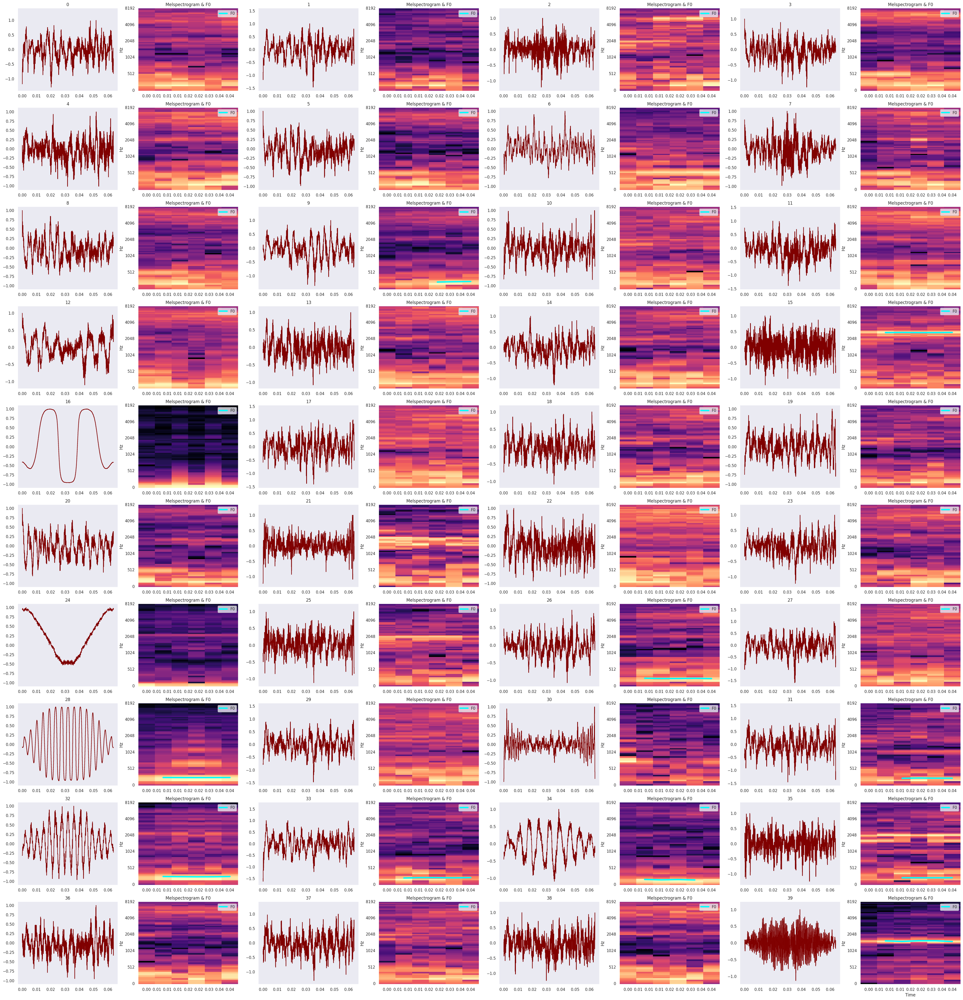

In [25]:
selected_emb_topk2 = torch.topk(zcs2, 240)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

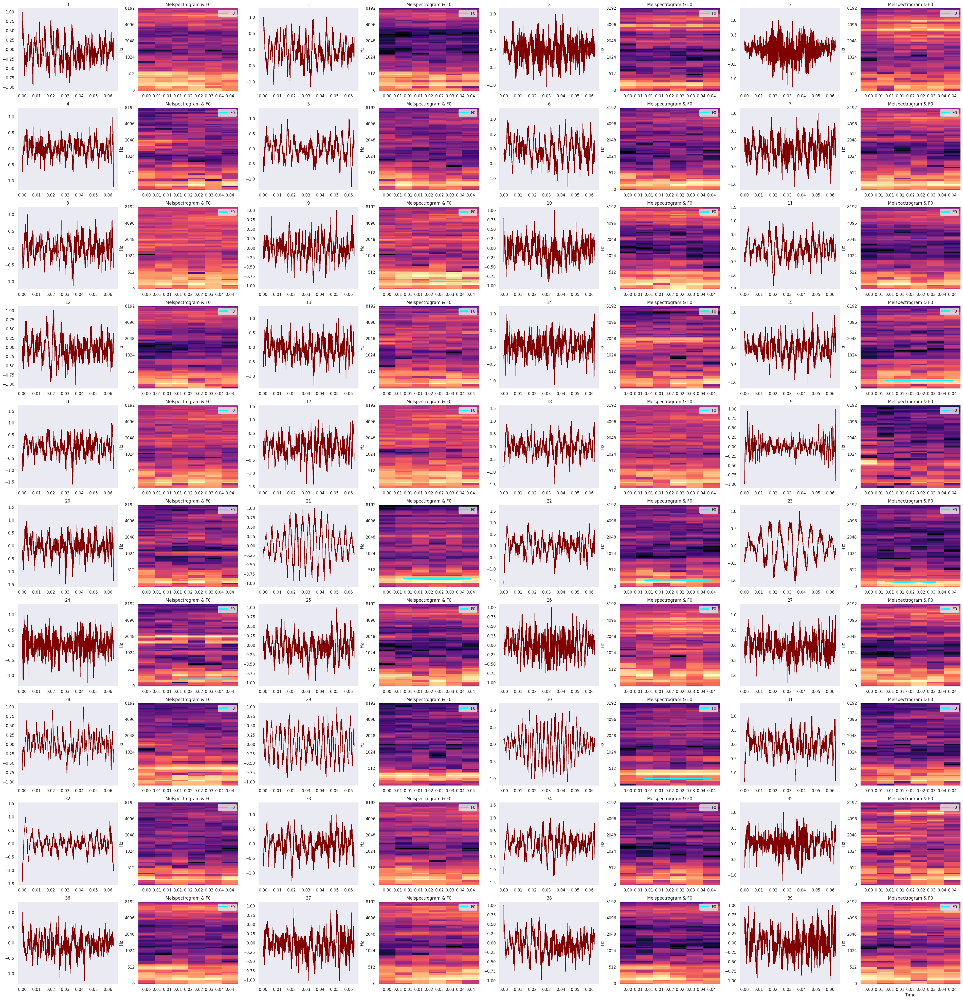

In [26]:
selected_emb_topk2 = torch.topk(zcs2, 280)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

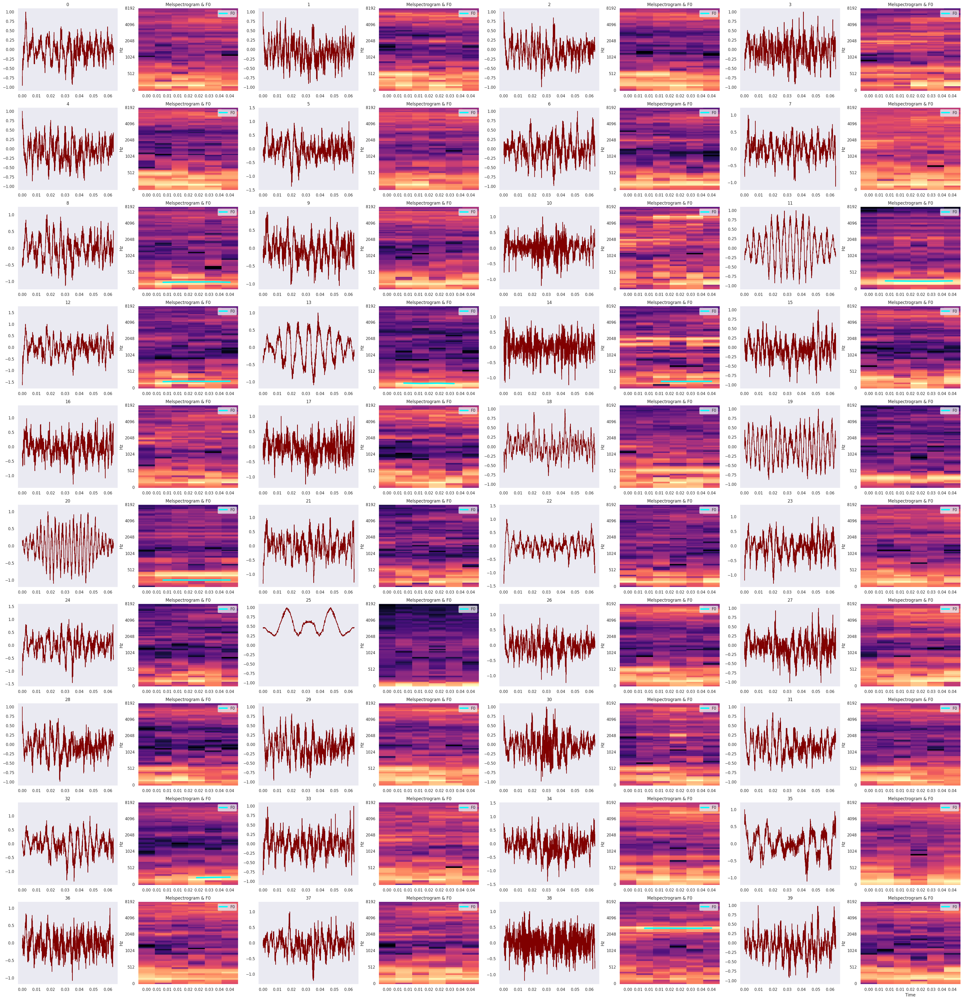

In [27]:
selected_emb_topk2 = torch.topk(zcs2, 320)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

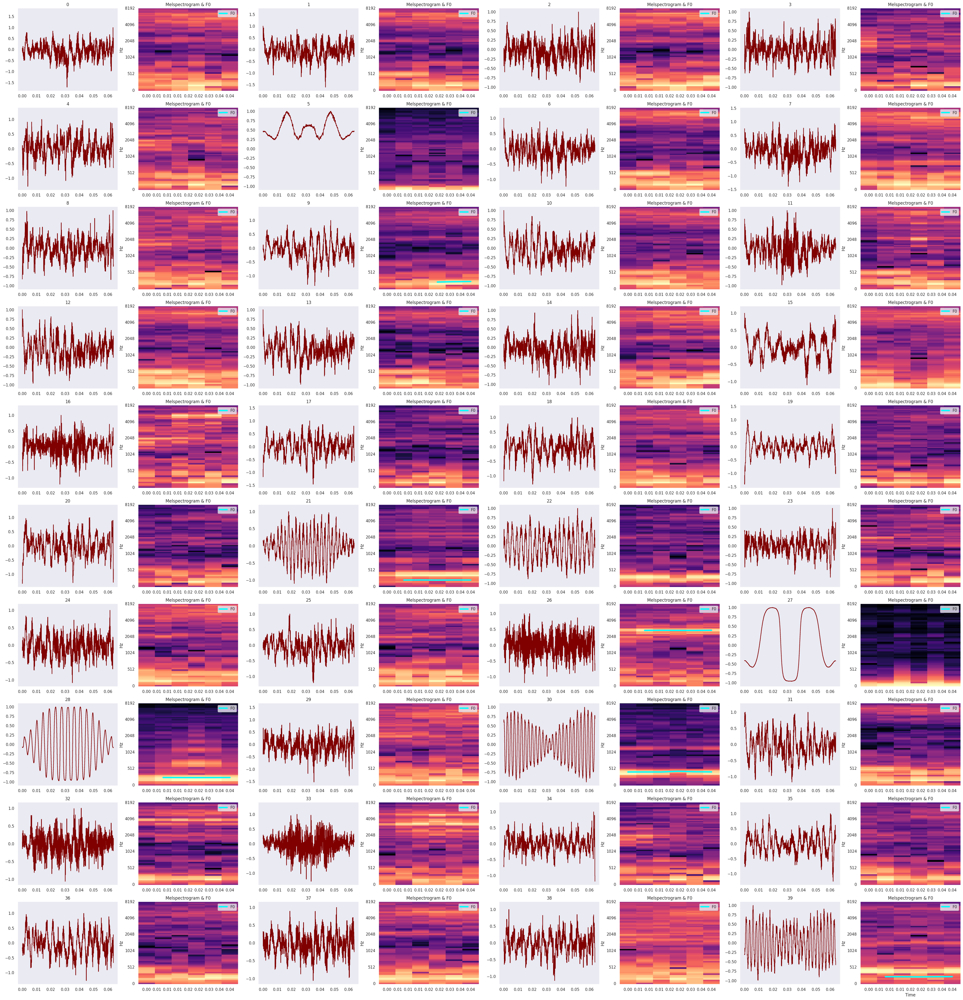

In [28]:
selected_emb_topk2 = torch.topk(zcs2, 360)
selected_idx2 = selected_emb_topk2.indices[-40:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=80, colors=emb_color2[selected_idx2])

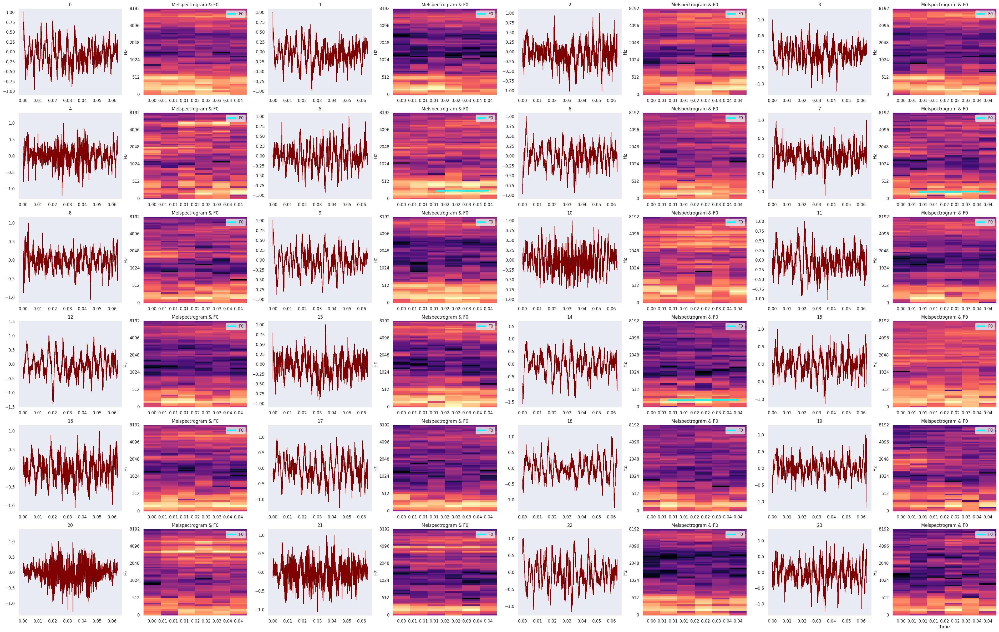

In [29]:
selected_emb_topk2 = torch.topk(zcs2, 384)
selected_idx2 = selected_emb_topk2.indices[-24:]
visualize_speech_codebook(
    emb_data2[selected_idx2].numpy(), 
    n=48, colors=emb_color2[selected_idx2])

In [35]:
trainer.train_losses_detail

[VqVaeClsLoss(perplexity=51.78746795654297, loss_vq=163.8538818359375, loss_recon=9.954008102416992, loss_cls=1.3687314987182617),
 VqVaeClsLoss(perplexity=12.62226676940918, loss_vq=158.8741455078125, loss_recon=7.491772651672363, loss_cls=1.4028605222702026),
 VqVaeClsLoss(perplexity=71.836181640625, loss_vq=371.7727966308594, loss_recon=9.946481704711914, loss_cls=1.4413515329360962),
 VqVaeClsLoss(perplexity=34.143611907958984, loss_vq=114.21414947509766, loss_recon=8.721101760864258, loss_cls=1.38009774684906),
 VqVaeClsLoss(perplexity=44.113216400146484, loss_vq=59.5446662902832, loss_recon=9.949241638183594, loss_cls=1.3237378597259521),
 VqVaeClsLoss(perplexity=48.07543182373047, loss_vq=381.5580749511719, loss_recon=9.96643352508545, loss_cls=1.3183714151382446),
 VqVaeClsLoss(perplexity=39.18452453613281, loss_vq=397.0678405761719, loss_recon=9.950250625610352, loss_cls=1.467839002609253),
 VqVaeClsLoss(perplexity=20.851831436157227, loss_vq=45.68119812011719, loss_recon=7.46

In [37]:
trainer.test_accuracy

[]

In [36]:
df = pd.DataFrame(columns=['loss', 'val_acc', *VqVaeClsLoss._fields])
df

,loss,val_acc,perplexity,loss_vq,loss_recon,loss_cls


In [38]:
dt = []
for i, ld in enumerate(trainer.train_losses_detail):
    d = {'loss': trainer.train_losses[i]}
    for j, k in enumerate(ld._fields):
        d[k] = ld[j]
    dt.append(d)
print(dt[0])

{'loss': 26.47627067565918, 'perplexity': 51.78746795654297, 'loss_vq': 163.8538818359375, 'loss_recon': 9.954008102416992, 'loss_cls': 1.3687314987182617}


In [39]:
df = pd.DataFrame(dt)
df

,loss,perplexity,loss_vq,loss_recon,loss_cls
0,26.476271,51.787468,163.853882,9.954008,1.368731
1,23.519474,12.622267,158.874146,7.491773,1.402861
2,47.267899,71.836182,371.772797,9.946482,1.441352
3,20.280527,34.143612,114.214149,8.721102,1.380098
4,16.036081,44.113216,59.544666,9.949242,1.323738
...,...,...,...,...,...
10269,144.331055,5.032969,140.386993,3.886125,0.579415
10270,213.704620,9.952669,203.680389,9.905622,1.186044
10271,1030.656982,7.191086,1025.603760,4.953857,0.994232
10272,203.778717,13.700394,197.470612,6.199050,1.090510


In [41]:
df.columns

Index(['loss', 'perplexity', 'loss_vq', 'loss_recon', 'loss_cls'], dtype='object')

In [43]:
df.columns[0]

'loss'

In [42]:
df[df.columns[0]]

0          26.476271
1          23.519474
2          47.267899
3          20.280527
4          16.036081
            ...     
10269     144.331055
10270     213.704620
10271    1030.656982
10272     203.778717
10273      29.416601
Name: loss, Length: 10274, dtype: float64

In [46]:
from scipy.signal import savgol_filter

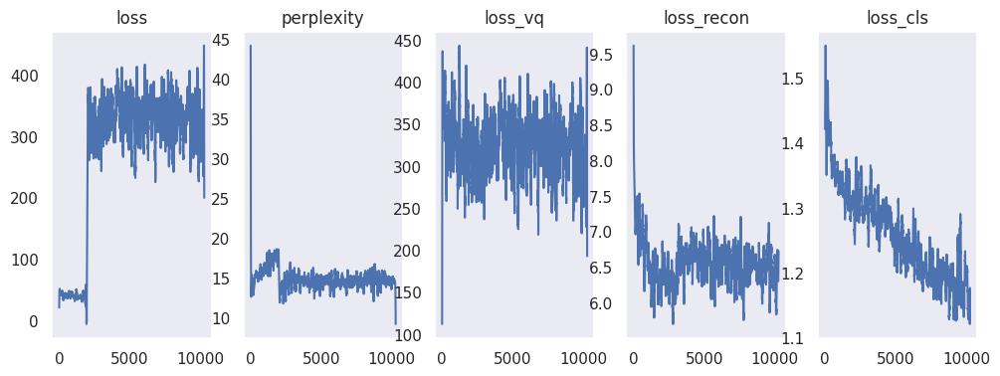

In [47]:
fig, axes = plt.subplots(1, 5, figsize=(12,4))
for i, c in enumerate(df.columns):
    axes[i].plot(savgol_filter(df[c], 301, 7))
    axes[i].set_title(c)

In [ ]:
import pandas as pd
import IPython.display as ipd
import seaborn as sns

from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color_v2
)

from IConNet.acov.audio_viz import (
    show_feature, compute_pitch, display_audio_list)

In [ ]:
visualize_training_curves(
    test_accuracy, train_res_cls_loss,
    train_res_recon_error, train_res_perplexity
)

In [ ]:
k = 2
min_dist = 0.99
umap_metric = 'euclidean'
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 8
min_dist = 0.8
umap_metric = 'braycurtis'
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

In [ ]:
selected_emb_topk = torch.topk(zcs, 40)
selected_idx = selected_emb_topk.indices
visualize_speech_codebook(
    emb_data[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx])

In [ ]:
players = display_audio_list(emb_data3_np, emb3_selected_pidx, f"emb3 ")
for p in players:
    display(p)